Name: Syed Asad Rizvi

ERP ID: 25365

Subject: Deep Learning

Project: Human Action Recognition Using CNN & LSTM (LRCN Approach)

**Mounting Google Drive**

First, we have mounted Colab with Google Drive in order to read data later.

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


**Installing relevant libraries**


Installing multiple libraries for image and video reading, downloading and classification.

In [2]:
!pip install youtube-dl moviepy imageio==2.4.1
!pip install git+https://github.com/Cupcakus/pafy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 24.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 66.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for imageio: filename=imageio-2.4.1-py3-none-any.whl size=3303886 sha256=f18cfe9901638f0536d8119c28da7c91ead731e340f5c501a9982c9e2d345279
  Stored in directory: /root/.cache/pip/wheels/be/7b/04/4d8d56f1d503e5c404f0de6018c0cfa592c71588a39b49e002
Successfully built imageio
  Attempting uninstall: imageio
    Found existing installation: imageio 2.9.0
    Uninstalling imageio-2.9.0:
      Successfully uninstalled imageio-2.9.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/Cupcakus/pafy to /tmp/pip-req-build-0229eey6
  Running command git clone --filter=blob:none --quiet https://github.com/Cupcakus/pa

**Importing Libraries**

In [3]:
# To hide output
%%capture

import os
import cv2
import pafy
import random
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
 
from moviepy.editor import * 
from sklearn.model_selection import train_test_split
 
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping

# **Dataset**

We have used UCF101 videos dataset which is an action recognition data that contains 101 action categories, containing multiple videos. All videos are collected from YouTube, and are based on realistic actions.

In [4]:
# Displaying the dataset directory

print(os.listdir('gdrive/My Drive/UCF101 Dataset/UCF-101'))

['BasketballDunk', 'BenchPress', 'BandMarching', 'BabyCrawling', 'BaseballPitch', 'BalanceBeam', 'ApplyLipstick', 'Archery', 'Basketball', 'ApplyEyeMakeup', 'BreastStroke', 'BlowDryHair', 'Biking', 'Billiards', 'BoxingSpeedBag', 'BodyWeightSquats', 'BoxingPunchingBag', 'BlowingCandles', 'BrushingTeeth', 'Bowling', 'CliffDiving', 'Fencing', 'Drumming', 'CuttingInKitchen', 'CricketShot', 'CleanAndJerk', 'FieldHockeyPenalty', 'Diving', 'CricketBowling', 'FloorGymnastics', 'HeadMassage', 'HighJump', 'Haircut', 'HandstandWalking', 'FrontCrawl', 'HammerThrow', 'FrisbeeCatch', 'GolfSwing', 'Hammering', 'HandstandPushups', 'JugglingBalls', 'HorseRiding', 'Kayaking', 'IceDancing', 'JavelinThrow', 'Knitting', 'HorseRace', 'HulaHoop', 'JumpRope', 'JumpingJack', 'LongJump', 'Nunchucks', 'Mixing', 'PlayingDaf', 'PizzaTossing', 'MilitaryParade', 'ParallelBars', 'MoppingFloor', 'PlayingCello', 'Lunges', 'PlayingViolin', 'PommelHorse', 'PlayingGuitar', 'PlayingDhol', 'PlayingTabla', 'PullUps', 'Playin

**Picking random categories & displaying single frame of videos as images**

Extracting 24 random categories out of 101 and picking the frame of each selected category to display it with respective class name on each frame.

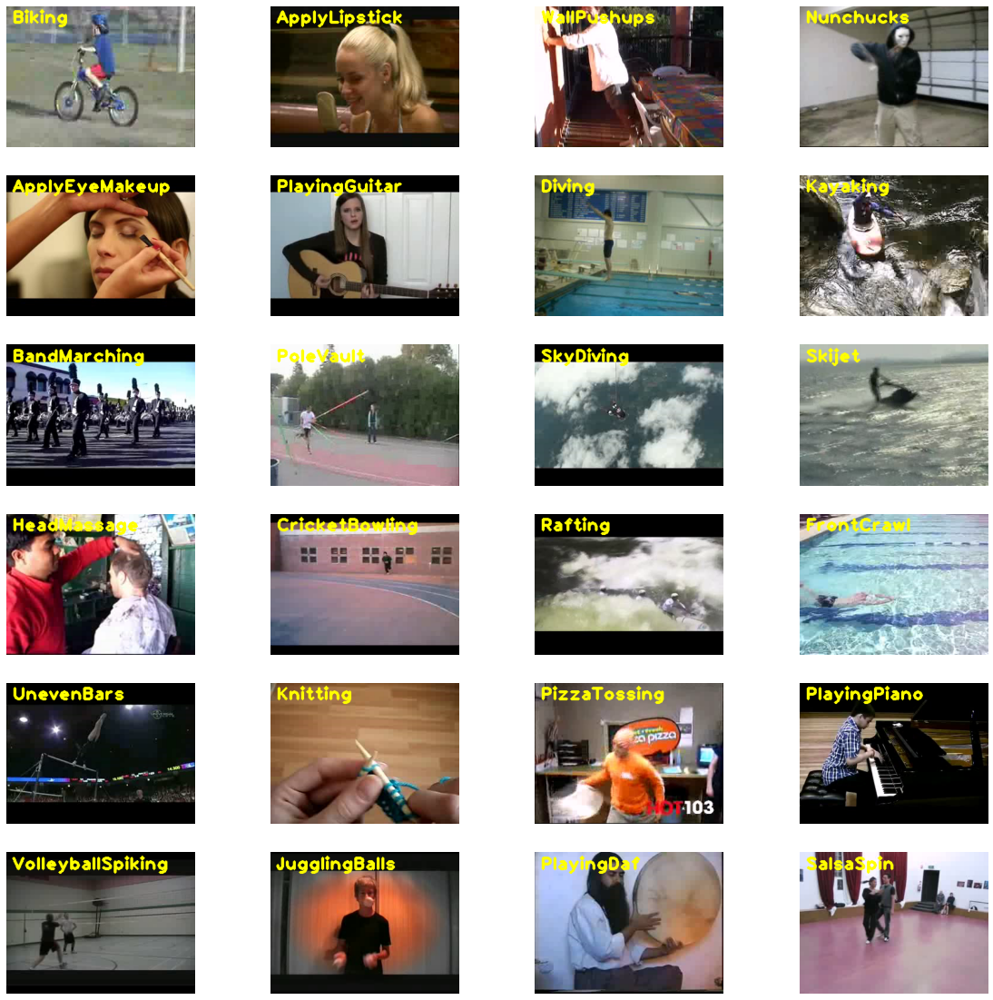

In [5]:
# Creating a figure of size 20x20

plt.figure(figsize = (20, 20))

classes = os.listdir('gdrive/My Drive/UCF101 Dataset/UCF-101')       # Storing names of all categories of UCF101 dataset
random_range = random.sample(range(len(classes)), 24)           # Taking 24 random sample values

# putText() parameters

org = (10, 30)        # at a distance 10 from the left edge & distance 30 from the top edge of the image
fontFace = cv2.FONT_HERSHEY_PLAIN         # font type
fontScale = 2           # font size
color = (255, 255, 0)   # font color
thickness = 3     # thickness of text

# Looping through all the randomly generated values

for counter, value in enumerate(random_range, 1):
    class_name = classes[value]                   # Selecting a class from list of categories
    videos_list = os.listdir(f'gdrive/My Drive/UCF101 Dataset/UCF-101/{class_name}')       # Contains names of all the videos in the selected class 
    selected_video = random.choice(videos_list)      # Selecting a random video file from the selected class directory
    read_video = cv2.VideoCapture(f'gdrive/My Drive/UCF101 Dataset/UCF-101/{class_name}/{selected_video}')         # Read the random video to capture its frame
    _, bgr_frame = read_video.read()          # Reading the single frame of the video 
    read_video.release()          # Releasing the first frame of the randomly selected video. 
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)        # Converting the extracted single frame to RGB.
    cv2.putText(rgb_frame, class_name, org, fontFace, fontScale, color, thickness)       # Writing string class name on the frame.
    
    # Plotting the frames
    plt.subplot(6, 4, counter)
    plt.imshow(rgb_frame)
    plt.axis('off')

# **Data Preprocessing**

Preprocessing the data by initializing the image width and image height to resize the frames, along with defining sequence length (for LSTM) and classes list for training.

In [6]:
img_height, img_width = 64, 64          # Changing the images' dimension to 64x64
sequence_length = 20          # Sampling out 20 frames in a video for LSTM
dataset_dir = "gdrive/My Drive/UCF101 Dataset/UCF-101"         # UCF101 Dataset directory
 
# List of classes that will be used for training
classes_list = ["Archery", "Billiards", "CricketBowling", "GolfSwing", "HorseRiding", "Knitting", "PlayingGuitar", "PlayingPiano", "Punch", "Skiing", "TableTennisShot", "WalkingWithDog"]

**Extracting, Resizing & Normalizing frames from the video**

After initializing, we have defined a function to extract the frames of each video in each selected category, followed by the resizing of the images to the defined dimensions and normalization to get pixel values between 0 & 1, which will help in training.

In [7]:
def extracting_frames(video_path):
  
    list_of_frames = []          # Storing video frames
    read_video = cv2.VideoCapture(video_path)         # Capturing video using the video path
    frames_count = int(read_video.get(cv2.CAP_PROP_FRAME_COUNT))            # Counting total number of frames in the video.
    frames_skip_sequence = max(int(frames_count/sequence_length), 1)          # Calculating frame skip sequence to find which frames to add

    # Iterating through video frames

    for counter_i in range(sequence_length):
        read_video.set(cv2.CAP_PROP_POS_FRAMES, counter_i * frames_skip_sequence)      # Unset the frame's first position, and read the frame from a certain point 
        read_success, frame = read_video.read()      # Video frame reading

        if not read_success:          # To check whether the frame is read correctly
            break

        frame_resized = cv2.resize(frame, (img_height, img_width))     # Frame resizing
        frame_normalized = frame_resized/255             # Normalizing the frame to get pixel values between 0 & 1
        list_of_frames.append(frame_normalized)          # Storing the normalized frame in list
    
    read_video.release()            # Releasing the video captured in video path
    return list_of_frames

**Dataset Creation**

Using frame extraction function to create the dataset by separating out preprocessed features equal to sequence length, and class indexes as category labels.

In [8]:
def dataset_creation():

  preprocessed_features = []             # empty list to store preprocessed frames from different categories
  category_labels = []               # empty list to store all the category names of the videos
  video_paths = []                # empty list to store all the video paths
    
  # Looping through the classes in the class list

  for index, class_name in enumerate(classes_list):
    print(f'Class: {class_name}')             # Printing the respective class name
    list_of_video_files = os.listdir(os.path.join(dataset_dir, class_name))     # Getting all the video files list of a specific class  
      
    # Looping through the video files present in the list

    for video_file in list_of_video_files:
      file_path = os.path.join(dataset_dir, class_name, video_file)         # Complete video path present in the directory
      frames = extracting_frames(file_path)                                 # Gives all the preprocessed frames of the video

      # To confirm if the number of frames are equal to sequence length

      if len(frames) == sequence_length:            
        preprocessed_features.append(frames)        # Appending preprocessed frames in features list
        category_labels.append(index)               # Appending class labels of respective video frame
        video_paths.append(file_path)               # Appending video file paths in a list

  # Converting Python list to numpy arrays

  preprocessed_features = np.asarray(preprocessed_features)
  category_labels = np.array(category_labels)  
    
  return preprocessed_features, category_labels, video_paths

In [9]:
# Calling the function to create dataset and display classes taken for training

preprocessed_features, category_labels, video_paths  = dataset_creation()

Class: Archery
Class: Billiards
Class: GolfSwing
Class: HorseRiding
Class: Knitting
Class: PlayingGuitar
Class: PlayingPiano
Class: Punch
Class: Skiing
Class: TableTennisShot
Class: WalkingWithDog


**One-hot encoding**

In [10]:
# Conversion of array class labels to one hot encoded vectors (using to_categorical method)

one_hot_encoded_labels = to_categorical(category_labels)

# **Train-test Splitting**

In [11]:
# Splitting the data into train (80%) and test (20%)

x_train, x_test, y_train, y_test = train_test_split(preprocessed_features, one_hot_encoded_labels, test_size = 0.2, shuffle = True, random_state = 0)

# **Implementing the Long-term Recurrent Convolutional Network (LRCN)**

Long-term Recurrent Convolutional Network (LRCN) is a type of Neural Network in which CNN and LSTM (RNN) layers are combined in a single model. Both CNN and LSTM (RNN) share learning parameters (weights) across time. CNN is used to extract features from the frames, and these extracted features are then fed to the LSTM at each time step to make action predictions.

A Time Distributed layer is used to apply the same transformation to all the frames of the video. So, all the layers are wrapped in a time distributed layer, and hence everything is applied on the whole sequence. 

In [12]:
def LRCN_model():
  model = Sequential()

  # Convolutional Neural Network with Time distributed layers

  model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same',activation = 'relu'),
                              input_shape = (sequence_length, img_height, img_width, 3)))
  model.add(TimeDistributed(MaxPooling2D((4, 4)))) 
  model.add(TimeDistributed(Dropout(0.25)))
    
  model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same',activation = 'relu')))
  model.add(TimeDistributed(MaxPooling2D((4, 4))))
  model.add(TimeDistributed(Dropout(0.25)))
    
  model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
  model.add(TimeDistributed(MaxPooling2D((2, 2))))
  model.add(TimeDistributed(Dropout(0.25)))
    
  model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same',activation = 'relu')))
  model.add(TimeDistributed(MaxPooling2D((2, 2))))
                                      
  model.add(TimeDistributed(Flatten()))

  # LSTM model taking the extracted features of frames from CNN

  model.add(LSTM(32))                      
  model.add(Dense(len(classes_list), activation = 'softmax'))

  return model

**Model building**

In [13]:
# Building the LRCN model

model_LRCN = LRCN_model()

**Training & compiling the model**

In [14]:
early_stopping = EarlyStopping(monitor = 'val_loss', patience = 75, mode = 'min', restore_best_weights = True)      # Early stopping

model_LRCN.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])    # Model compilation

model_training = model_LRCN.fit(x = x_train, y = y_train, epochs = 60, batch_size = 4 , shuffle = True, validation_split = 0.2, callbacks = [early_stopping])  # Model training

Epoch 1/60
269/269 [==============================] - 61s 218ms/step - loss: 2.2915 - accuracy: 0.1859 - val_loss: 2.0556 - val_accuracy: 0.2963
Epoch 2/60
269/269 [==============================] - 56s 207ms/step - loss: 1.9168 - accuracy: 0.3401 - val_loss: 1.7396 - val_accuracy: 0.4370
Epoch 3/60
269/269 [==============================] - 54s 201ms/step - loss: 1.6901 - accuracy: 0.4294 - val_loss: 1.5811 - val_accuracy: 0.4593
Epoch 4/60
269/269 [==============================] - 56s 208ms/step - loss: 1.5095 - accuracy: 0.4851 - val_loss: 1.4604 - val_accuracy: 0.5111
Epoch 5/60
269/269 [==============================] - 54s 202ms/step - loss: 1.3038 - accuracy: 0.5660 - val_loss: 1.2038 - val_accuracy: 0.6222
Epoch 6/60
269/269 [==============================] - 53s 199ms/step - loss: 1.1710 - accuracy: 0.6069 - val_loss: 1.2856 - val_accuracy: 0.5741
Epoch 7/60
269/269 [==============================] - 56s 207ms/step - loss: 1.0650 - accuracy: 0.6264 - val_loss: 1.1660 - val_ac

**Model Evaluation**

In [15]:
# Evaluating the trained model

model_evaluation = model_LRCN.evaluate(x_test, y_test)

11/11 [==============================] - 5s 461ms/step - loss: 0.3966 - accuracy: 0.9139


**Plotting Loss & Accuracy Curves**

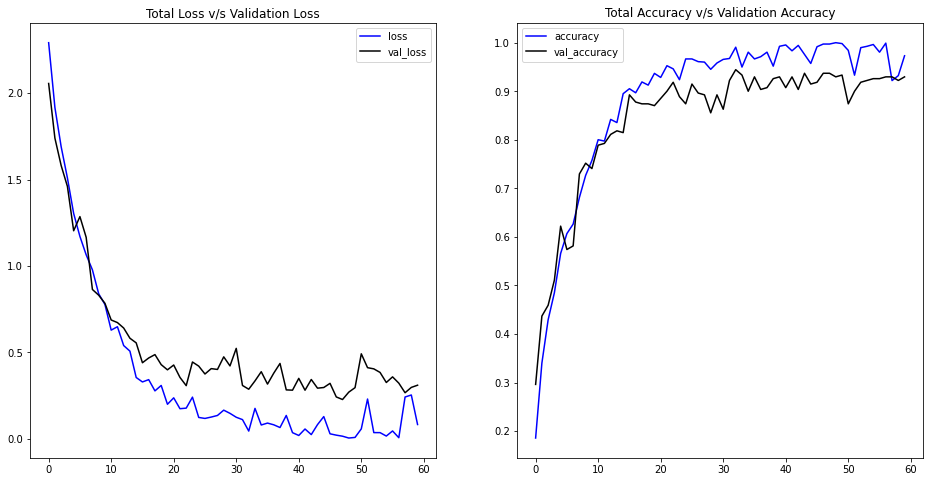

In [45]:
# Extracting model's loss and validation loss metrics at each epoch

model_loss = model_training.history["loss"]
model_val_loss = model_training.history['val_loss']

# Extracting model's accuracy and validation accuracy metrics at each epoch

model_accuracy = model_training.history['accuracy']
model_val_accuracy = model_training.history['val_accuracy']
  
# Defining epoch range to be used as x-axis

epochs = range(len(model_loss))

# Setting figure size

plt.figure(figsize = (16,8))

# Plotting loss curves

plt.subplot(1,2,1)
plt.plot(epochs, model_loss, 'blue', label = 'loss')
plt.plot(epochs, model_val_loss, 'black', label = 'val_loss')
plt.title("Total Loss v/s Validation Loss")
plt.legend()

# Plotting accuracy curves

plt.subplot(1,2,2)
plt.plot(epochs, model_accuracy, 'blue', label = 'accuracy')
plt.plot(epochs, model_val_accuracy, 'black', label = 'val_accuracy')
plt.title("Total Accuracy v/s Validation Accuracy")
plt.legend()

plt.show()

# **Testing the model on YouTube videos**

In this step, a function is created first to download YouTube videos using pafy library, and an output path is created to store these videos.

In [46]:
# Creating a function to download YouTube videos

def youtube_video_download(video_url, output_dir):
  new_video = pafy.new(video_url)             # Create a new video object containing video URL 
  video_title = new_video.title               # Get the video title
  video_best = new_video.getbest()            # Get the highest quality stream of video
  output_path = f'{output_dir}/{video_title}.mp4'        # Declare the output file path.
  video_best.download(filepath = output_path, quiet = True)          # Download the youtube video directly and store it in the output path
  return video_title

Utilizing the test function to download a Youtube video by providing video URL, and storing in a test directory.

In [47]:
# Using the function to download videos

test_dir = 'youtube_videos'             
os.makedirs(test_dir, exist_ok = True)         # Creating a new test directory for videos
youtube_video_title = youtube_video_download('https://www.youtube.com/watch?v=r8vJgIH-Vto', test_dir)       # Download the video.
input_video_path = f'{test_dir}/{youtube_video_title}.mp4'       # Storing the downloaded video in the test directory

**Performing Prediction on Videos**

For action prediction, a function is created to extract the frames of the downloaded video with sequence length. LRCN model will be applied to the list of frames to predict probabilities, and to extract the class index of highest probability.

In [48]:
def action_prediction(file_path, sequence_length):

  read_video = cv2.VideoCapture(file_path)              # Capturing video using the video path

  video_width = int(read_video.get(cv2.CAP_PROP_FRAME_WIDTH))      # Checking the width of the frame
  video_height = int(read_video.get(cv2.CAP_PROP_FRAME_HEIGHT))    # Checking the height of the frame

  list_of_frames = []                # Storing the extracted video frames in a list
  predicted_class = ''               # Storing the class of action in the video.    

  frames_count = int(read_video.get(cv2.CAP_PROP_FRAME_COUNT))            # Retrieving total number of frames in the video.
  frames_skip_sequence = max(int(frames_count/sequence_length), 1)        # Calculating frame skip sequence to find which frames to add
  
  # Looping through the number of frames equal to sequence length

  for counter_i in range(sequence_length):
      read_video.set(cv2.CAP_PROP_POS_FRAMES, counter_i * frames_skip_sequence)              # Set the current frame position of the video.
      read_success, frame = read_video.read()                   # Reading frame of the video.

      if not read_success:                 # To check whether the frame is read correctly
          break

      frame_resized = cv2.resize(frame, (img_height, img_width))     # Frame resizing
      frame_normalized = frame_resized/255                           # Normalizing the frame to get pixel values between 0 & 1
      list_of_frames.append(frame_normalized)                        # Storing the normalized frame in list

  predicted_probabilities = model_LRCN.predict(np.expand_dims(list_of_frames, axis = 0))[0]           # Applying the model to get predicted proabilities on the list of frames

  label_predicted = np.argmax(predicted_probabilities)                  # Extracting the class index of highest probability

  class_name_predicted = classes_list[label_predicted]                  # Extracting the class name using the index.

  # Predicted action and confidence

  print(f'Predicted Action: {class_name_predicted}')
  print(f'Confidence: {predicted_probabilities[label_predicted]}')
        
  read_video.release()

In [49]:
# Predicting action on the test video

action_prediction(input_video_path, sequence_length)

# Display the input video.

VideoFileClip(input_video_path, audio=False, target_resolution=(300, None)).ipython_display()

1/1 [==============================] - 1s 830ms/step
Predicted Action: Knitting
Confidence: 0.9991443157196045


100%|██████████| 1689/1689 [00:26<00:00, 64.19it/s] 
